## Course Name: CSC 761-UT1 - Advanced Artificial Intelligence - Spring 2024

### Team Member 1: Imtiaj Uddin Ahamed

### Data Source Link : https://www.kaggle.com/datasets/ninadaithal/imagesoasis/data

## 1. Import libraries

In [1]:
import numpy as np 
import keras
import seaborn as sns
import matplotlib.pyplot as plt
from keras.models import Sequential
import PIL
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, precision_score, recall_score, roc_curve
from PIL import Image
import numpy as np
from matplotlib.pyplot import imshow
import os
import pandas as pd
from tqdm import tqdm
import re  # Import the re module for regular expressions
from scipy.stats import skew
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Deciding a Metric
The most conventional metric to use is accuracy, but it cannot be used for imbalanced datasets. Let's examine the number of images in each class. This script analyzes a directory to determine the number of files in each folder. It traverses the directory tree, counts the files, and stores the counts in a dictionary. The script visualizes the data with a bar chart and prints a summary of each folder's file counts.

In [2]:

# Specify the directory path
dir_path = "~/python_repo/2nd_sem_pro/Data/"

# Expand the '~' symbol to the absolute path
dir_path = os.path.expanduser(dir_path)

# Check if the directory exists
if os.path.exists(dir_path) and os.path.isdir(dir_path):
    # Initialize a dictionary to store the counts for each folder
    folder_counts = {}
    
    # Traverse the directory tree recursively
    for root, dirs, files in os.walk(dir_path):
        # Get the name of the current directory
        folder_name = os.path.relpath(root, dir_path)
        
        # Exclude the current directory itself
        if folder_name != '.':
            file_count = len(files)
            folder_counts[folder_name] = file_count
    
    # Remove the entry for the current directory specially for MAC os 
    folder_counts.pop('.', None)
    
    # Print the counts for each folder
    for folder_name, file_count in folder_counts.items():
        print(f"Number of files in '{folder_name}': {file_count}")
    


Number of files in 'VerymildDementia': 13725
Number of files in 'ModerateDementia': 488
Number of files in 'MildDementia': 5002
Number of files in 'NonDemented': 67222


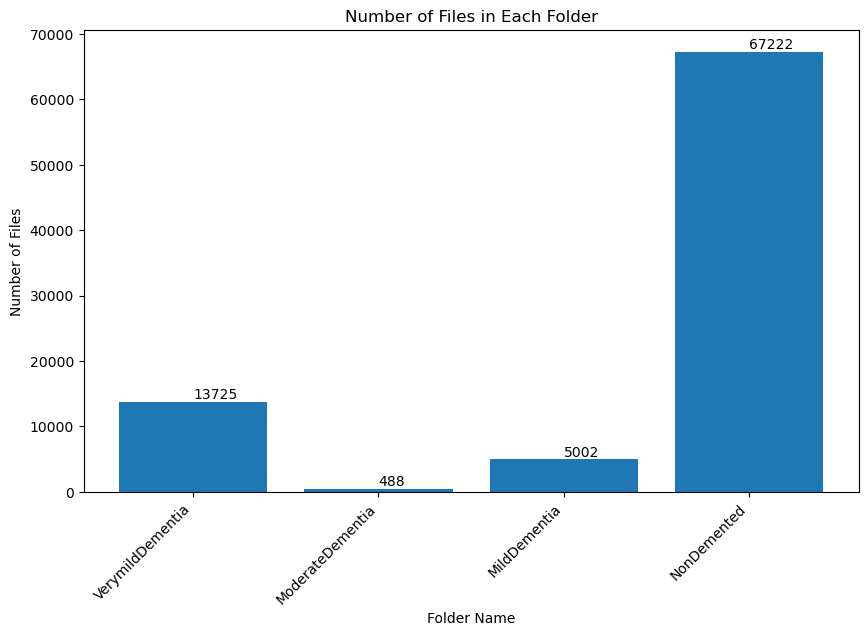

In [3]:
if os.path.exists(dir_path):
    # Visualize the number of files in each folder as a bar chart
    plt.figure(figsize=(10, 6))
    bars = plt.bar(folder_counts.keys(), folder_counts.values())
    plt.xlabel('Folder Name')
    plt.ylabel('Number of Files')
    plt.title('Number of Files in Each Folder')
    plt.xticks(rotation=45, ha='right')
    
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), va='bottom')

    plt.show()
else:
    print(f"Directory '{dir_path}' does not exist.")


The dataset is <span style="color:red;"> **"Imbalanced"**.</span>

## 3. Loading and Organizing Dementia Image 
We're using a Kaggle dataset on Alzheimer's disease. The code below downloads and stores images in separate lists based on categories of dementia. It displays the first 'non_demented' image and prints the length of each category's list for confirmation.

In [4]:
non_demented = []
very_mild_demented = []
mild_demented = []
moderate_demented = []

# Load per category
for dirname, _, filenames in os.walk('/Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/NonDemented'):
    for filename in filenames:
        non_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/VeryMildDementia'):
    for filename in filenames:
        very_mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/MildDementia'):
    for filename in filenames:
        mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/ModerateDementia'):
    for filename in filenames:
        moderate_demented.append(os.path.join(dirname, filename))


In [6]:
print(len(non_demented))
print(len(mild_demented))
print(len(moderate_demented))
print(len(very_mild_demented))

451
451
451
451


## 4. EDA

This  segment performs Exploratory Data Analysis (EDA) on an Alzheimer's disease dataset. It validates filenames, extracts metadata, calculates image statistics, and visualizes label distribution and relationships between image statistics. Its purpose is to provide statistical analysis and visualization of the Alzheimer's dataset to understand its characteristics.

In [7]:
def validate_filename(filename):
    """
    Validate filename to ensure it is a valid OASIS Alzheimer's dataset filename.
    """
    pattern = re.compile('OAS1_\d+_MR\d+_mpr-\d+_\d+.jpg')
    return bool(pattern.match(filename))


In [8]:
def get_info_from_filename(filename):
    """
    Extract patient_id and layer_id from filename
    """
    pattern = re.compile('OAS1_(\d+)_MR(\d+)_mpr-(\d+)_(\d+).jpg')
    match = pattern.match(filename)
    patient_id = match.group(1)
    mr_id = match.group(2)
    scan_id = match.group(3)
    layer_id = match.group(4)

    return patient_id, mr_id, scan_id, layer_id

In [9]:
def create_ref_df(dataset_path):
    """
    Create a reference dataframe with the following columns:
    - path: path to the image
    - label: label of the image
    - patient_id: patient id
    - mr_id: session number of the mr
    - scan_id: id of scan in the corresponding mr session
    - layer_id: layer id of the image -> [100, 160]
    """
    paths, labels = [], []
    patient_ids, mr_ids, scan_ids, layer_ids = [], [], [], []

    for folder in os.listdir(dataset_path):
        # Skip .DS_Store file
        if folder == '.DS_Store':
            continue
        for file in os.listdir(os.path.join(dataset_path, folder)):
            if not validate_filename(file):
                raise ValueError(f'Invalid filename: {folder}/{file}')

            patient_id, mr_id, scan_id, layer_id = get_info_from_filename(file)

            paths.append(os.path.join(dataset_path, folder, file))
            labels.append(folder)
            patient_ids.append(patient_id)
            mr_ids.append(mr_id)
            scan_ids.append(scan_id)
            layer_ids.append(layer_id)

    ref_df = pd.DataFrame({
        'path': paths,
        'label': labels,
        'patient_id': patient_ids,
        'mr_id': mr_ids,
        'scan_id': scan_ids,
        'layer_id': layer_ids
    })

    ref_df = ref_df.astype({
        'path': 'string',
        'label': 'string',
        'patient_id': 'int64',
        'mr_id': 'int64',
        'scan_id': 'int64',
        'layer_id': 'int64'
    })

    return ref_df


#### Load the image to calculates image statistics, and visualizes label distribution and relationships between image statistics.

In [10]:

def validate_filename(filename):
    return bool(re.match(r'OAS1_\d+_MR\d+_mpr-\d+_\d+.jpg', filename))

def get_info_from_filename(filename):
    match = re.match(r'OAS1_(\d+)_MR(\d+)_mpr-(\d+)_(\d+).jpg', filename)
    return match.groups()

def create_ref_df(dataset_path):
    data = []
    for folder in os.listdir(dataset_path):
        if folder == '.DS_Store':
            continue
        for file in os.listdir(os.path.join(dataset_path, folder)):
            if not validate_filename(file):
                raise ValueError(f'Invalid filename: {folder}/{file}')
            patient_id, mr_id, scan_id, layer_id = get_info_from_filename(file)
            data.append((
                os.path.join(dataset_path, folder, file),
                folder,
                int(patient_id),
                int(mr_id),
                int(scan_id),
                int(layer_id)
            ))
    
    columns = ['path', 'label', 'patient_id', 'mr_id', 'scan_id', 'layer_id']
    ref_df = pd.DataFrame(data, columns=columns)
    ref_df['path'] = ref_df['path'].astype('string')
    ref_df['label'] = ref_df['label'].astype('string')
    ref_df[['patient_id', 'mr_id', 'scan_id', 'layer_id']] = ref_df[['patient_id', 'mr_id', 'scan_id', 'layer_id']].astype('int64')
    
    return ref_df

def load_images(ref_df):
    images = []
    labels = ref_df['label'].tolist()
    paths = ref_df['path'].tolist()
    
    for path in tqdm(paths, total=len(paths)):
        images.append(np.array(Image.open(path).convert('L')))
    
    return images, labels, paths

def get_image_stats(images, labels, paths):
    stats = []
    for image in tqdm(images, total=len(images)):
        stats.append((
            np.mean(image),
            np.std(image),
            image.shape[0],
            image.shape[1],
            skew(np.histogram(image.flatten())[0])
        ))
    
    columns = ['mean', 'std', 'width', 'height', 'skew']
    image_stats = pd.DataFrame(stats, columns=columns)
    image_stats['label'] = labels
    image_stats['path'] = paths
    
    return image_stats


ref_df = create_ref_df('/Users/imtiaj101/python_repo/2nd_sem_pro/Data')
images, labels, paths = load_images(ref_df)
image_stats = get_image_stats(images, labels, paths)


100%|████████████████████████████████████| 86437/86437 [03:38<00:00, 396.30it/s]


 ### 4.1 Histogram of Labels

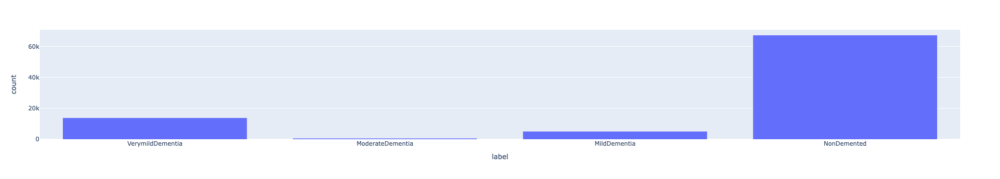

In [11]:
import plotly.express as px

px.histogram(ref_df, x='label')

#### Checking if the dataset is balanced. 



The dataset is <span style="color:red;"> **"Imbalanced"**.</span>

### 4.2 Mean of Images vs Skew of Image Histogram

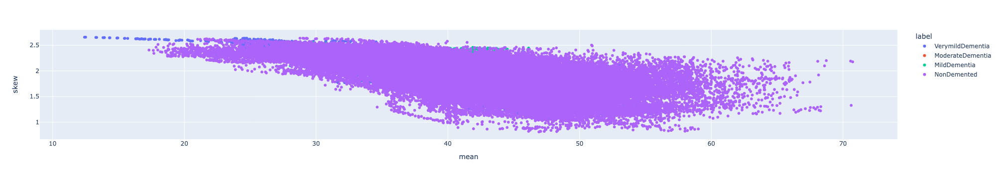

In [13]:
px.scatter(image_stats, x='mean', y='skew', color='label')

## 5. Data Pre-proccessing

**Making a new dataset that is balanced by using the minimum number of images contained in a category among all categories**

In [15]:
non_demented=non_demented[0:450]
mild_demented=mild_demented[0:450]
very_mild_demented=very_mild_demented[0:450]
moderate_demented=moderate_demented[0:450]

In [16]:
print(len(non_demented))
print(len(mild_demented))
print(len(moderate_demented))
print(len(very_mild_demented))

450
450
450
450


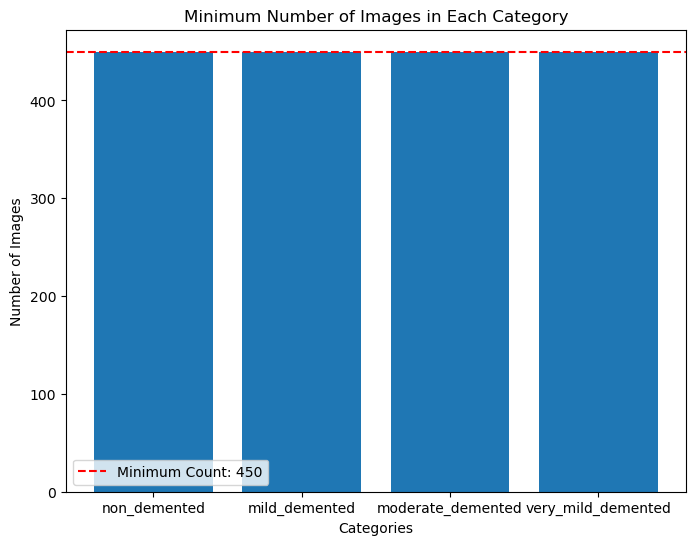

In [65]:
import matplotlib.pyplot as plt

# Calculate the minimum count for each category
categories = ['non_demented', 'mild_demented', 'moderate_demented', 'very_mild_demented']
counts = [len(non_demented), len(mild_demented), len(moderate_demented), len(very_mild_demented)]
min_count = min(counts)

# Plotting the bar chart
plt.figure(figsize=(8, 6))
plt.bar(categories, counts)
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Minimum Number of Images in Each Category')
plt.axhline(y=min_count, color='red', linestyle='--', label=f'Minimum Count: {min_count}')
plt.legend()
plt.show()


### 5.1 One Hot Encoding
As we are dealing with categorical and non-continuous data, it is necessary to transform our model into one-hot encodings. One-hot encodings are a technique to help the model understand that we are working with categorical data, and not continuous data. This process of transforming features to make them more understandable is commonly known as feature engineering. You can learn more about feature engineering and its techniques for better data analysis.

* 0 -> non_demented
* 1 -> mild_dementia
* 2 -> moderate_dementia
* 3 -> very_mild_dementia


In [18]:
encoder= OneHotEncoder()
encoder.fit([[0],[1],[2],[3]])

OneHotEncoder()



This section resizes image data for Alzheimer's disease classification to a shape of 128x128x3, stores it with labels, and sets up evaluation metrics functions with an empty DataFrame to store scores. Uncommenting and filling the model evaluation part with actual metrics calculated from the model predictions is all that's left. Finally, the code prints the aggregated scores DataFrame. This code demonstrates data preprocessing and evaluation setup for Alzheimer's disease classification using image data.

### 5.2 Reshape the data

In [19]:
from PIL import Image, UnidentifiedImageError  # Import UnidentifiedImageError

data = []
result = []

for s in non_demented:
    try:
        img = Image.open(s)
        img = img.resize((128, 128))
        img = np.array(img)
        if img.shape == (128, 128, 3):
            data.append(np.array(img))
            result.append(encoder.transform([[0]]).toarray())
    except (UnidentifiedImageError, OSError):
        print(f"Ignoring {s} as it is not a valid image file.")




Ignoring /Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/NonDemented/.DS_Store as it is not a valid image file.


In [20]:
# Repeat the same process for other categories (mild_demented, moderate_demented, very_mild_demented)

for s in mild_demented:
    try:
        img = Image.open(s)
        img = img.resize((128,128))
        img = np.array(img)
        if(img.shape == (128,128,3)):
            data.append(np.array(img))
            result.append(encoder.transform([[1]]).toarray())
    except (UnidentifiedImageError, OSError):
        print(f"Ignoring {s} as it is not a valid image file.")



Ignoring /Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/MildDementia/.DS_Store as it is not a valid image file.


In [21]:
for s in moderate_demented:
    try:
        img = Image.open(s)
        img = img.resize((128,128))
        img = np.array(img)
        if(img.shape == (128,128,3)):
            data.append(np.array(img))
            result.append(encoder.transform([[2]]).toarray())
    except (UnidentifiedImageError, OSError):
        print(f"Ignoring {s} as it is not a valid image file.")


Ignoring /Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/ModerateDementia/.DS_Store as it is not a valid image file.


In [22]:
for s in very_mild_demented:
    try:
        img = Image.open(s)
        img = img.resize((128,128))
        img = np.array(img)
        if(img.shape == (128,128,3)):
            data.append(np.array(img))
            result.append(encoder.transform([[3]]).toarray())
    except (UnidentifiedImageError, OSError):
        print(f"Ignoring {s} as it is not a valid image file.")

Ignoring /Users/imtiaj101/python_repo/2nd_sem_pro/small_dataset/train/VeryMildDementia/.DS_Store as it is not a valid image file.


In [23]:
X=np.array(data)


In [24]:
X.shape

(1796, 128, 128, 3)

In [25]:
y=np.array(result)
y=y.reshape(X.shape[0],4)
y=np.argmax(y, axis=1)
y

array([0, 0, 0, ..., 3, 3, 3])

### This function are used for to capture all model score 

In [26]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

def evaluate_model(accuracy, precision, recall, f1, roc_auc, model_name="Model", scores_df=None):
    
    """
        # If the model has predict_proba method (e.g., for classifiers), calculate ROC-AUC
        if hasattr(model, 'predict_proba'):
            y_prob = model.predict_proba(X_test)[:, 1]
            roc_auc = roc_auc_score(y_test, y_prob)
        else:
            roc_auc = None
    """
    # Create a DataFrame for the current model
    temp_df_model = pd.DataFrame({
        'Model': [model_name],
        'Accuracy': [accuracy],
        'Precision': [precision],
        'Recall': [recall],
        'F1 Score': [f1],
        'ROC-AUC': [roc_auc]
    })
    
    # Initialize scores_df if it is None
    if scores_df is None:
        scores_df = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
    
    # Append scores for the current model
    scores_df = pd.concat([scores_df, temp_df_model], ignore_index=True)
    
    return scores_df, temp_df_model

# Initialize an empty DataFrame to store aggregated scores
scores_df = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

print("Aggregated Scores DataFrame:")
print(scores_df)

Aggregated Scores DataFrame:
Empty DataFrame
Columns: [Model, Accuracy, Precision, Recall, F1 Score, ROC-AUC]
Index: []


## 6. Model Implementation: 

### Data Split into Train and Test
##### This line of code splits the dataset and corresponding labels into training and testing sets, with 80% of the data allocated for training and 20% for testing, using a random seed for reproducibility.

In [27]:
X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.2,random_state=42)

In [28]:
X_train.shape

(1436, 128, 128, 3)

In [29]:
X_test.shape

(360, 128, 128, 3)

## 6.1 Random Forest

In [30]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, precision_score, recall_score, roc_curve
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Initialize the RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the RandomForestClassifier
rf_classifier.fit(X_train.reshape(-1, 128*128*3), y_train)

y_pred = rf_classifier.predict(X_test.reshape(-1, 128*128*3))



## 6.2 Model Evaluation (RF):

In [31]:
# Calculate Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='weighted')
print("Precision:", precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='weighted')
print("Recall:", recall)

# Calculate AUC
y_pred_prob = rf_classifier.predict_proba(X_test.reshape(-1, 128*128*3))
auc_score = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')
print("AUC:", auc_score)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot ROC Curve
fpr = dict()
tpr = dict()
roc_auc_score_dict = dict() 


Accuracy: 0.8583333333333333
Precision: 0.856730768434563
Recall: 0.8583333333333333
AUC: 0.9643320628830496
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.74      0.77        90
           1       0.85      0.91      0.88        90
           2       0.97      1.00      0.99        78
           3       0.82      0.80      0.81       102

    accuracy                           0.86       360
   macro avg       0.86      0.86      0.86       360
weighted avg       0.86      0.86      0.86       360



In [32]:
# Assuming you already have scores_df initialized
scores_df = scores_df[scores_df['Model'] != 'RandomForestClassifier']
scores_df, temp_df_model = evaluate_model(accuracy, precision, recall,'' , auc_score, model_name="RandomForestClassifier", scores_df=scores_df)
scores_df

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,RandomForestClassifier,0.858333,0.856731,0.858333,,0.964332


## 6.3 Logistic Regression

In [33]:
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

logistic_regression = LogisticRegression(random_state=42, max_iter=1000)

logistic_regression.fit(X_train.reshape(-1, 128*128*3), y_train)

# Make predictions on the test set
y_pred = logistic_regression.predict(X_test.reshape(-1, 128*128*3))



## 6.4 Model Evaluation (LR):

In [34]:
# Calculate Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='weighted')
print("Precision:", precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='weighted')
print("Recall:", recall)

# Calculate AUC
y_pred_prob = logistic_regression.predict_proba(X_test.reshape(-1, 128*128*3))
auc_score = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')
print("AUC:", auc_score)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))



Accuracy: 0.8305555555555556
Precision: 0.8295192305710322
Recall: 0.8305555555555556
AUC: 0.950376225138347
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.74      0.74        90
           1       0.83      0.92      0.87        90
           2       0.99      1.00      0.99        78
           3       0.80      0.70      0.74       102

    accuracy                           0.83       360
   macro avg       0.84      0.84      0.84       360
weighted avg       0.83      0.83      0.83       360



In [35]:
# Assuming you already have scores_df initialized
scores_df = scores_df[scores_df['Model'] != 'LogisticRegression']
scores_df, temp_df_model = evaluate_model(accuracy, precision, recall,'' , auc_score, model_name="LogisticRegression", scores_df=scores_df)
scores_df

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,RandomForestClassifier,0.858333,0.856731,0.858333,,0.964332
1,LogisticRegression,0.830556,0.829519,0.830556,,0.950376


## 6.5 Extra Trees

In [36]:
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, precision_score, recall_score, roc_curve
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesClassifier

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the ExtraTreesClassifier
extra_trees_classifier = ExtraTreesClassifier(n_estimators=100, random_state=42)
extra_trees_classifier.fit(X_train.reshape(-1, 128*128*3), y_train)

# Make predictions on the test set
y_pred = extra_trees_classifier.predict(X_test.reshape(-1, 128*128*3))



## 6.6 Model Evaluation (ET):

In [37]:
# Calculate Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='weighted')
print("Precision:", precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='weighted')
print("Recall:", recall)

# Calculate AUC
y_pred_prob = extra_trees_classifier.predict_proba(X_test.reshape(-1, 128*128*3))
auc_score_value = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')
print("AUC:", auc_score_value)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))



Accuracy: 0.8916666666666667
Precision: 0.8921186704178077
Recall: 0.8916666666666667
AUC: 0.9764681886248614
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82        90
           1       0.91      0.94      0.93        90
           2       0.99      1.00      0.99        78
           3       0.82      0.87      0.84       102

    accuracy                           0.89       360
   macro avg       0.90      0.90      0.90       360
weighted avg       0.89      0.89      0.89       360



In [38]:
# Assuming you already have scores_df initialized
scores_df = scores_df[scores_df['Model'] != 'extra_trees']
scores_df, temp_df_model = evaluate_model(accuracy, precision, recall,'' , auc_score_value, model_name="extra_trees", scores_df=scores_df)
scores_df

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,RandomForestClassifier,0.858333,0.856731,0.858333,,0.964332
1,LogisticRegression,0.830556,0.829519,0.830556,,0.950376
2,extra_trees,0.891667,0.892119,0.891667,,0.976468


## 6.7 CNN Model


### 6.7.1 Set-up Model

In [66]:

BASE_PATH = os.path.expanduser("~/python_repo/2nd_sem_pro/small_dataset_/")
TRAIN_PATH = os.path.join(BASE_PATH, "train")
TEST_PATH = os.path.join(BASE_PATH, "val")
BATCH_SIZE_BASE = 26
IMAGE_SIZE = [176, 208]  
EPOCHS = 300
SEED = 1337

In [67]:
# Set up the GPU strategy
strategy = tf.distribute.MirroredStrategy()
print('Number of devices:', strategy.num_replicas_in_sync)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Number of devices: 1


In [68]:
# Adjust batch size according to the number of GPUs
BATCH_SIZE = BATCH_SIZE_BASE * strategy.num_replicas_in_sync

In [69]:

# Dataset loading functions
def load_dataset(path, subset_type):
    return tf.keras.preprocessing.image_dataset_from_directory(
        path,
        validation_split=0.2,
        subset=subset_type,
        seed=SEED,
        image_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
    )

In [70]:
train_ds = load_dataset(TRAIN_PATH, "training")
val_ds = load_dataset(TEST_PATH, "validation")
class_names = ['MildDementia', 'ModerateDementia', 'NonDementia', 'VeryMildDementia']
train_ds.class_names = class_names
val_ds.class_names = class_names
NUM_CLASSES = len(class_names)

Found 7792 files belonging to 4 classes.
Using 6234 files for training.
Found 881 files belonging to 4 classes.
Using 176 files for validation.


In [71]:

# Function to apply one-hot encoding
def one_hot_label(image, label):
    label = tf.cast(label, dtype=tf.int32)  # Cast label to int32
    label = tf.one_hot(label, NUM_CLASSES)
    return image, label

In [72]:
train_ds = train_ds.map(one_hot_label, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_ds = val_ds.map(one_hot_label, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [73]:
# Define the block for convolutional layers with separable convolutions
def conv_block(filters):
    block = tf.keras.Sequential([
        tf.keras.layers.SeparableConv2D(filters, 3, activation='relu', padding='same'),
        tf.keras.layers.SeparableConv2D(filters, 3, activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPool2D()
    ])
    return block

In [74]:
# Define the block for dense layers including dropout and batch normalization
def dense_block(units, dropout_rate):
    block = tf.keras.Sequential([
        tf.keras.layers.Dense(units, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate)
    ])
    return block

In [75]:
# Function to build the entire model architecture
def build_model(image_size, num_classes):
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(*image_size, 3)),
        tf.keras.layers.Conv2D(16, 3, activation='relu', padding='same'),
        tf.keras.layers.Conv2D(16, 3, activation='relu', padding='same'),
        tf.keras.layers.MaxPool2D(),
        conv_block(32),
        conv_block(64),
        conv_block(128),
        tf.keras.layers.Dropout(0.2),
        conv_block(256),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Flatten(),
        dense_block(512, 0.7),
        dense_block(128, 0.5),
        dense_block(64, 0.3),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [76]:
# Configure distributed strategy
strategy = tf.distribute.MirroredStrategy()

with strategy.scope():
    model = build_model(IMAGE_SIZE, NUM_CLASSES)
    model.compile(
        optimizer='adam',
        loss=tf.losses.CategoricalCrossentropy(),
        metrics=[
            tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
            tf.keras.metrics.AUC(name='auc')
        ]
    )


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


### 6.7.2 Training the Model¶
In order to optimize the training of our model, we will be utilizing callbacks. These callbacks will help us adjust the learning rate and stop our model once it has converged.

It's important to note that the learning rate is a crucial hyperparameter in the model. If the learning rate is set too high, the model will not be able to converge. On the other hand, if the learning rate is set too low, the training process will be too slow. Stopping the model early is a preventive measure against overfitting.

In [77]:
# Callbacks and learning rate scheduler
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 ** (epoch / s)
    return exponential_decay_fn

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(exponential_decay(0.01, 20))
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    "alzheimer_model.keras",  # Change the file extension to .keras
    save_best_only=True
)

#### Let's fit our model!

In [78]:

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

# Model training
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[checkpoint_cb, early_stopping_cb]
)


Epoch 1/300
240/240 [==============================] - 18s 66ms/step - loss: 0.6490 - accuracy: 0.7709 - auc: 0.9271 - val_loss: 0.9089 - val_accuracy: 0.7330 - val_auc: 0.8801
Epoch 2/300
240/240 [==============================] - 16s 64ms/step - loss: 0.2405 - accuracy: 0.9257 - auc: 0.9893 - val_loss: 0.9697 - val_accuracy: 0.4943 - val_auc: 0.8058
Epoch 3/300
240/240 [==============================] - 15s 62ms/step - loss: 0.1025 - accuracy: 0.9761 - auc: 0.9973 - val_loss: 0.5278 - val_accuracy: 0.7898 - val_auc: 0.9612
Epoch 4/300
240/240 [==============================] - 15s 62ms/step - loss: 0.0849 - accuracy: 0.9785 - auc: 0.9975 - val_loss: 0.5217 - val_accuracy: 0.8239 - val_auc: 0.9701
Epoch 5/300
240/240 [==============================] - 15s 61ms/step - loss: 0.0642 - accuracy: 0.9833 - auc: 0.9985 - val_loss: 0.6569 - val_accuracy: 0.7614 - val_auc: 0.9324
Epoch 6/300
240/240 [==============================] - 15s 61ms/step - loss: 0.0864 - accuracy: 0.9758 - auc: 0.997

### 6.8 Model Evaluation (ET):

In [80]:
import matplotlib.pyplot as plt

# Evaluate the model on the validation dataset
results = model.evaluate(val_ds)

val_loss = results[0]
val_accuracy = results[1]
val_auc = results[2]

# Calculate precision and recall
precision = tf.keras.metrics.Precision()
recall = tf.keras.metrics.Recall()
for images, labels in val_ds:
    predictions = model(images)
    precision.update_state(labels, predictions)
    recall.update_state(labels, predictions)

# Get precision and recall values
val_precision = precision.result().numpy()
val_recall = recall.result().numpy()

print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Validation AUC:", val_auc)
print("Validation Precision:", val_precision)
print("Validation Recall:", val_recall)



7/7 [==============================] - 0s 30ms/step - loss: 0.2552 - accuracy: 0.9318 - auc: 0.9836
Validation Loss: 0.25523364543914795
Validation Accuracy: 0.9318181872367859
Validation AUC: 0.9835624694824219
Validation Precision: 0.73295456
Validation Recall: 0.73295456


### 6.8.1 Model Evaluation ( Training and Validation Accuracy):

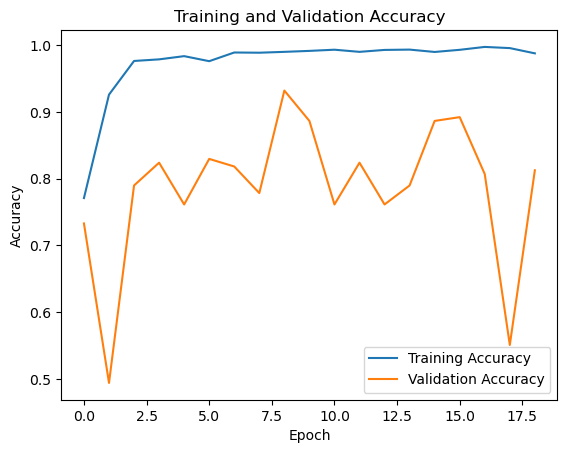

In [81]:

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()


### 6.8.2 Model Evaluation ( Training and Validation Accuracy)

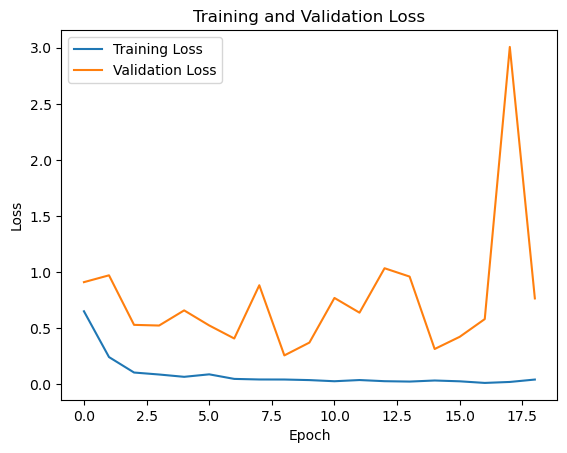

In [82]:

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


### 6.8.3 Model Evaluation ( AUC and Model Loss )

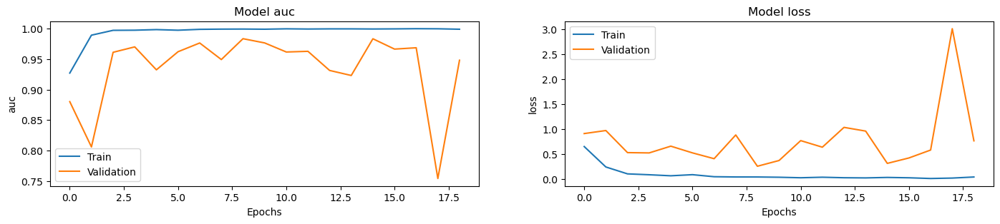

In [83]:
fig, ax = plt.subplots(1, 2, figsize=(17, 3))
ax = ax.ravel()

for i, met in enumerate(['auc', 'loss']):
    ax[i].plot(history.history[met])
    ax[i].plot(history.history['val_' + met])
    ax[i].set_title('Model {}'.format(met))
    ax[i].set_xlabel('Epochs')
    ax[i].set_ylabel(met)
    ax[i].legend(['Train', 'Validation'])




## 7. Result Analysis

In [84]:

scores_df = scores_df[scores_df['Model'] != 'CNN']
scores_df, temp_df_model = evaluate_model(val_accuracy, val_precision, val_recall,'' , val_auc, model_name="CNN", scores_df=scores_df)
final_score=scores_df

final_score.drop(columns=['F1 Score'], inplace=True)
final_score


,Model,Accuracy,Precision,Recall,ROC-AUC
0,RandomForestClassifier,0.858333,0.856731,0.858333,0.964332
1,LogisticRegression,0.830556,0.829519,0.830556,0.950376
2,extra_trees,0.891667,0.892119,0.891667,0.976468
3,CNN,0.931818,0.732955,0.732955,0.983562


## 7.1 Model Accuracy and ROC-AUC Comparison

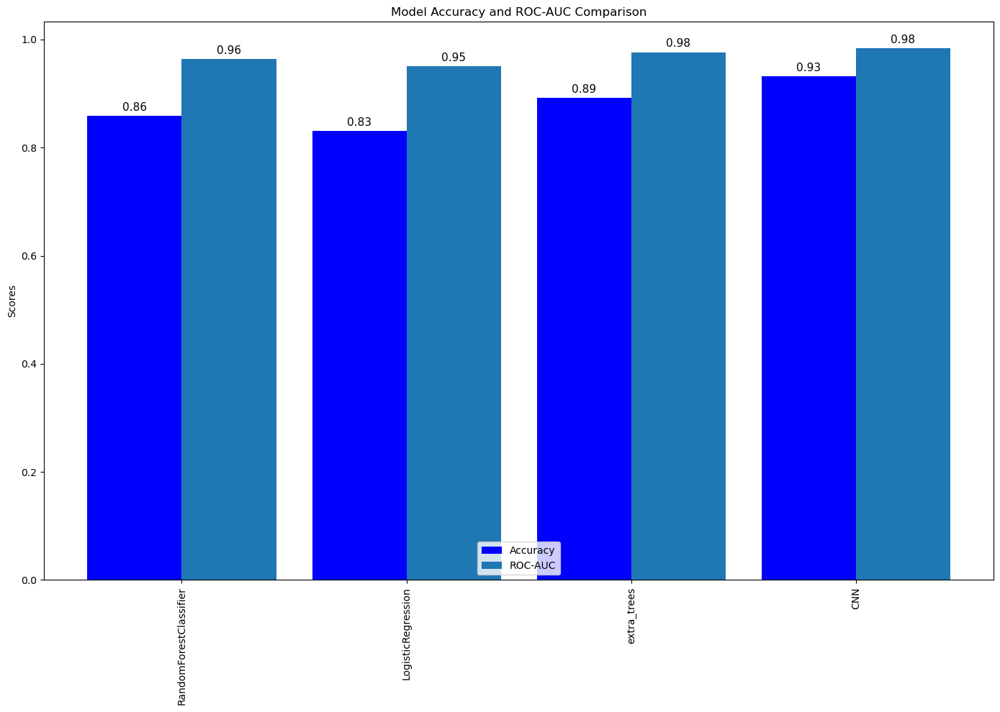

In [85]:

fig, ax = plt.subplots(figsize=(14, 10))

# Set the positions and width for the bars
positions = np.arange(len(final_score['Model']))
width = 0.42

# Plotting both Accuracy and ROC-AUC scores side by side for each model
accuracy_bars = ax.bar(positions - width/2, final_score['Accuracy'], width, label='Accuracy', color='blue')
roc_auc_bars = ax.bar(positions + width/2, final_score['ROC-AUC'], width, label='ROC-AUC')
ax.set_ylabel('Scores')
ax.set_title('Model Accuracy and ROC-AUC Comparison')
ax.set_xticks(positions)
ax.set_xticklabels(final_score['Model'])
plt.xticks(rotation=90)
def annotate_bars(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{}'.format(round(height, 2)),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=11)

annotate_bars(accuracy_bars)
annotate_bars(roc_auc_bars)

# Positioning legend at the lower center
ax.legend(loc='lower center')

plt.tight_layout()
plt.show()


## 7.2 Model Precision, Recall  Comparison

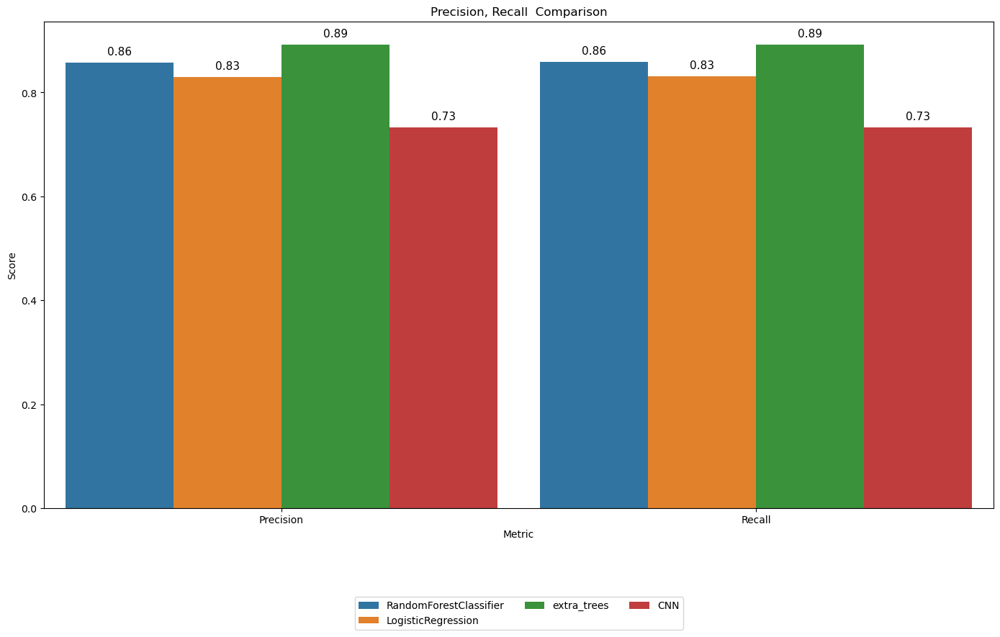

In [86]:

df_melted = final_score.melt(id_vars=["Model"], value_vars=["Precision", "Recall"],
                              var_name="Metric", value_name="Score")

# Create the bar plot
plt.figure(figsize=(14, 9))
ax = sns.barplot(x='Metric', y='Score', hue='Model', data=df_melted, width=.91)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='center', xytext=(0, 11), textcoords='offset points', fontsize=11)
plt.title('Precision, Recall  Comparison')
plt.xlabel('Metric')
plt.ylabel('Score')
plt.xticks(rotation=0)

plt.legend(bbox_to_anchor=(0.5, -0.26), loc='lower center', ncol=3, fontsize='medium')

plt.tight_layout()
plt.show()


## 8. Accuracy and Prediction

In [87]:
def names(number):
    if number == 0:
        return 'Non Demented'
    elif number == 1:
        return 'Mild Dementia'
    elif number == 2:
        return 'Moderate Dementia'
    elif number == 3:
        return 'Very Mild Dementia'
    else:
        return 'Error in Prediction'
# 0 --> Non Demented
# 1 --> Mild Dementia
# 2 --> Moderate Dementia
# 3 --> Very Mild Dementia 

In [88]:


def predict_image_class(image_path, model):
    # Open the image
    img = Image.open(image_path)

    # Resize the image to match the input shape of your model
    img_resized = img.resize((176, 208))
    x = np.array(img_resized)
    x = x.reshape(1, 176, 208, 3)
    # Perform prediction
    res = model.predict_on_batch(x)
    # Determine the classification
    classification = np.where(res == np.amax(res))[1][0]
    # Display the image
    imshow(img_resized)
    print(str(res[0][classification]*100)+ '% Confidence This Is '+ names(classification))
    return res[0][classification]*100, names(classification)


### 8.1 Predict Moderate Dementia

98.50702285766602% Confidence This Is Moderate Dementia


(98.50702285766602, 'Moderate Dementia')

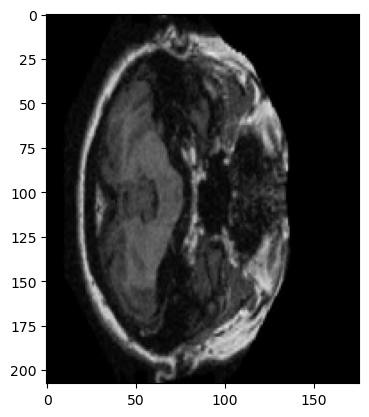

In [89]:
predict_image_class('/Users/imtiaj101/python_repo/2nd_sem_pro/Data/ModerateDementia/OAS1_0308_MR1_mpr-3_110.jpg', model)



### 8.2 Predict Moderate Dementia

98.60681295394897% Confidence This Is Moderate Dementia


(98.60681295394897, 'Moderate Dementia')

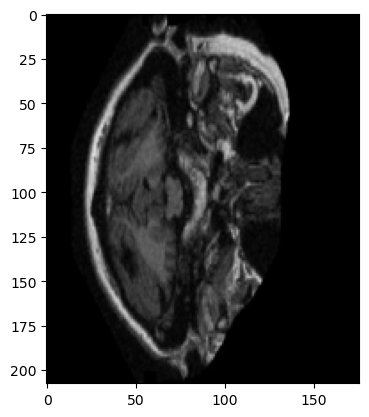

In [90]:
predict_image_class('/Users/imtiaj101/python_repo/2nd_sem_pro/Data/VerymildDementia/OAS1_0003_MR1_mpr-1_112.jpg', model)
